In [ ]:
# Yield vs area

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {'Corrected_Yield': 'CorrectedYield', 'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent'}
df = df.rename(columns=column_map)

# --- CALCULATION AND PLOTTING ---
for exp_name, exp_data in df.groupby('Experiment Name'):
    
    # Prepare data (drop rows with missing values in required columns)
    plot_df = exp_data.dropna(subset=['UncorrectedYield', 'CorrectedYield', 'HA_Percent']).copy()
    
    if len(plot_df) < 5:
        continue
        
    # Calculate the Difference
    plot_df['Yield_Diff'] = plot_df['UncorrectedYield'] - plot_df['CorrectedYield']
    
    # Create figure with 3 subplots
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
    sns.set_theme(style="whitegrid")

    def create_scatter(ax, x, y, title, color):
        # Fit linear regression for R2 calculation
        mask = ~np.isnan(x) & ~np.isnan(y)
        if len(x[mask]) > 1:
            slope, intercept = np.polyfit(x[mask], y[mask], 1)
            y_pred = slope * x[mask] + intercept
            r2 = r2_score(y[mask], y_pred)
            
            # Plot
            sns.regplot(x=x, y=y, ax=ax, color=color, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
            ax.set_title(f"{title}\n$R^2 = {r2:.3f}$")
        else:
            ax.set_title(f"{title} (Insufficient Data)")

    # 1. Uncorrected vs HA%
    create_scatter(ax1, plot_df['HA_Percent'], plot_df['UncorrectedYield'], "Uncorrected Yield vs HA%", "steelblue")
    ax1.set_ylabel("Uncorrected Yield (kg ha$^{-1}$)")

    # 2. Corrected vs HA%
    create_scatter(ax2, plot_df['HA_Percent'], plot_df['CorrectedYield'], "Corrected Yield vs HA%", "seagreen")
    ax2.set_ylabel("Corrected Yield (kg ha$^{-1}$)")

    # 3. Yield Difference vs HA%
    create_scatter(ax3, plot_df['HA_Percent'], plot_df['Yield_Diff'], "Yield Difference vs HA%", "indianred")
    ax3.set_ylabel("Uncorrected - Corrected (kg ha$^{-1}$)")

    # Global formatting
    for ax in [ax1, ax2, ax3]:
        ax.set_xlabel("Missing Area (%)")

    plt.suptitle(f"Trial Analysis: {exp_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save image
    file_name = f"Scatter_Analysis_{exp_name}.png".replace("/", "_")
    plt.savefig(file_name, dpi=300)
    plt.close(fig)

print("Scatter plot analysis complete. Figures for each trial have been saved.")

Scatter plot analysis complete. Figures for each trial have been saved.


In [ ]:
#scatter uncorrected and corrected and Delta yield vs area- one single image 

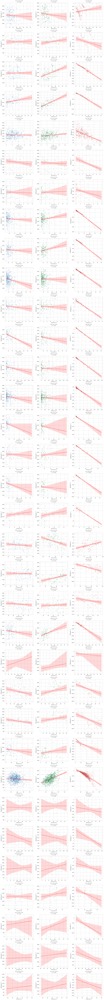

Combined analysis complete. All 34 trials saved in a single image.


In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {'Corrected_Yield': 'CorrectedYield', 'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent'}
df = df.rename(columns=column_map)

# Get list of unique trials that have enough data
valid_trials = []
for name, group in df.groupby('Experiment Name'):
    if len(group.dropna(subset=['UncorrectedYield', 'CorrectedYield', 'HA_Percent'])) >= 5:
        valid_trials.append(name)

num_trials = len(valid_trials)

# --- SET UP THE BIG GRID ---
# Each trial gets 1 row and 3 columns
fig, axes = plt.subplots(nrows=num_trials, ncols=3, figsize=(18, 5 * num_trials))
sns.set_theme(style="whitegrid")

# Handle case where there is only one trial (axes would not be a 2D array)
if num_trials == 1:
    axes = np.expand_dims(axes, axis=0)

def create_scatter(ax, x, y, title, color):
    mask = ~np.isnan(x) & ~np.isnan(y)
    if len(x[mask]) > 1:
        slope, intercept = np.polyfit(x[mask], y[mask], 1)
        y_pred = slope * x[mask] + intercept
        r2 = r2_score(y[mask], y_pred)
        
        sns.regplot(x=x, y=y, ax=ax, color=color, scatter_kws={'alpha':0.5, 's':15}, line_kws={'color':'red', 'lw':1.5})
        ax.set_title(f"{title}\n$R^2 = {r2:.3f}$", fontsize=10)
    else:
        ax.set_title(f"{title} (Insufficient Data)", fontsize=10)
    
    ax.set_xlabel("Missing Area (%)", fontsize=9)

# --- PLOTTING ---
for i, exp_name in enumerate(valid_trials):
    exp_data = df[df['Experiment Name'] == exp_name]
    plot_df = exp_data.dropna(subset=['UncorrectedYield', 'CorrectedYield', 'HA_Percent']).copy()
    plot_df['Yield_Diff'] = plot_df['UncorrectedYield'] - plot_df['CorrectedYield']
    
    # Get the 3 axes for the current row
    ax_uncorr, ax_corr, ax_diff = axes[i]

    # 1. Uncorrected vs HA%
    create_scatter(ax_uncorr, plot_df['HA_Percent'], plot_df['UncorrectedYield'], f"{exp_name}: Uncorr vs HA%", "steelblue")
    ax_uncorr.set_ylabel("Yield (kg ha$^{-1}$)")

    # 2. Corrected vs HA%
    create_scatter(ax_corr, plot_df['HA_Percent'], plot_df['CorrectedYield'], f"{exp_name}: Corr vs HA%", "seagreen")
    ax_corr.set_ylabel("Yield (kg ha$^{-1}$)")

    # 3. Yield Difference vs HA%
    create_scatter(ax_diff, plot_df['HA_Percent'], plot_df['Yield_Diff'], f"{exp_name}: Diff vs HA%", "indianred")
    ax_diff.set_ylabel("Diff (kg ha$^{-1}$)")

# Final formatting
plt.tight_layout()
plt.savefig('All_Trials_Combined_Analysis.png', dpi=200, bbox_inches='tight')
plt.show()

print(f"Combined analysis complete. All {num_trials} trials saved in a single image.")

In [ ]:
#gram per plant

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings for a cleaner output
warnings.simplefilter(action='ignore', category=FutureWarning)

# Define the file path and load the dataset
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

for exp_name, exp_data in df.groupby('Experiment_Name'):
    
    plot_df = exp_data.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()
    
    if len(plot_df) < 5:
        continue
        
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    sns.set_theme(style="whitegrid")

    def create_annotated_scatter(ax, x, y, x_label, y_label, title, color):
        # Apply the fixed axis limits as requested
        #ax.set_ylim(0, 5000)
        ax.set_xlim(0, 100)
        
        mask = ~np.isnan(x) & ~np.isnan(y)
        if len(x[mask]) > 1:
            slope, intercept = np.polyfit(x[mask], y[mask], 1)
            y_pred = slope * x[mask] + intercept
            r2 = r2_score(y[mask], y_pred)
            
            sns.regplot(x=x, y=y, ax=ax, color=color, scatter_kws={'alpha':0.6}, line_kws={'color':'red'})
            ax.set_title(f"{title}\n$R^2 = {r2:.3f}$")
        else:
            ax.set_title(f"{title} (Insufficient Data)")
            
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)

    # Subplot 1: Yield Per Plant vs Missing Area
    create_annotated_scatter(
        ax1, plot_df['HA_Percent'], plot_df['GramPerPlant'], 
        "Missing Area (%)", "Gram per Plant", 
        "Gram per Plant vs Missing Area", "darkcyan"
    )

    # Subplot 2: Yield Per Plant vs Harvestable Area
    create_annotated_scatter(
        ax2, plot_df['HarvestableArea'], plot_df['GramPerPlant'], 
        "Harvestable Area (%)", "Gram per Plant", 
        "Gram per Plant vs Harvestable Area", "darkmagenta"
    )

    plt.suptitle(f"Trial Yield Efficiency Analysis: {exp_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    output_filename = f"Yield_Efficiency_{exp_name}.png".replace("/", "_")
    plt.savefig(output_filename, dpi=300)
    plt.close(fig)

print("Analysis complete. All trials now use standardized axes (X: 0-100, Y: 0-5000).")

Analysis complete. All trials now use standardized axes (X: 0-100, Y: 0-5000).


In [ ]:
#Gram per plot all images in one image

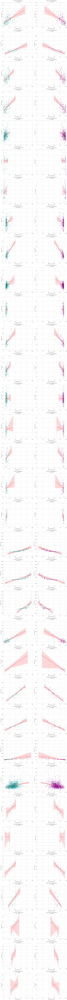

Combined analysis complete. All 34 trials compiled into one image.


In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings for a cleaner output
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

# Identify valid trials with enough data points
valid_trials = []
for name, group in df.groupby('Experiment_Name'):
    if len(group.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea'])) >= 5:
        valid_trials.append(name)

num_trials = len(valid_trials)

# --- SET UP THE MASTER GRID ---
# Each trial gets 1 row and 2 columns
fig, axes = plt.subplots(nrows=num_trials, ncols=2, figsize=(14, 6 * num_trials))
sns.set_theme(style="whitegrid")

# Handle edge case for a single valid trial
if num_trials == 1:
    axes = np.expand_dims(axes, axis=0)

def create_annotated_scatter(ax, x, y, x_label, y_label, title, color):
    # Set standardized X-axis range
    ax.set_xlim(0, 100)
    
    mask = ~np.isnan(x) & ~np.isnan(y)
    if len(x[mask]) > 1:
        slope, intercept = np.polyfit(x[mask], y[mask], 1)
        y_pred = slope * x[mask] + intercept
        r2 = r2_score(y[mask], y_pred)
        
        # Regression plot
        sns.regplot(x=x, y=y, ax=ax, color=color, scatter_kws={'alpha':0.6, 's':20}, line_kws={'color':'red', 'lw':1.5})
        ax.set_title(f"{title}\n$R^2 = {r2:.3f}$", fontsize=11)
    else:
        ax.set_title(f"{title} (Insufficient Data)", fontsize=11)
        
    ax.set_xlabel(x_label, fontsize=10)
    ax.set_ylabel(y_label, fontsize=10)

# --- PLOTTING LOOP ---
for i, exp_name in enumerate(valid_trials):
    exp_data = df[df['Experiment_Name'] == exp_name]
    plot_df = exp_data.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()
    
    # Select the two axes in the current row
    ax_missing, ax_harvest = axes[i]

    # Subplot 1: Gram per Plant vs Missing Area
    create_annotated_scatter(
        ax_missing, plot_df['HA_Percent'], plot_df['GramPerPlant'], 
        "Missing Area (%)", "Gram per Plant", 
        f"Trial {exp_name}: vs Missing Area", "darkcyan"
    )

    # Subplot 2: Gram per Plant vs Harvestable Area
    create_annotated_scatter(
        ax_harvest, plot_df['HarvestableArea'], plot_df['GramPerPlant'], 
        "Harvestable Area (%)", "Gram per Plant", 
        f"Trial {exp_name}: vs Harvestable Area", "darkmagenta"
    )

# Optimize layout and save
plt.tight_layout()
plt.savefig('Combined_Yield_Efficiency_Analysis.png', dpi=200, bbox_inches='tight')
plt.show()

print(f"Combined analysis complete. All {num_trials} trials compiled into one image.")

In [ ]:
#Gram per plant Overall

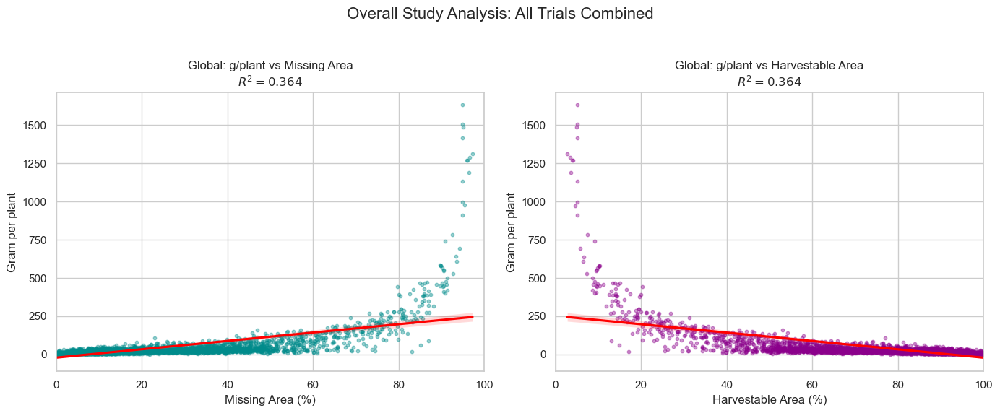

Global pooled plot generated.
Analysis complete. Global and individual trial plots have been saved.


In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

# --- SHARED PLOTTING FUNCTION ---
def create_annotated_scatter(ax, x, y, x_label, y_label, title, color):
    ax.set_xlim(0, 100)
    
    mask = ~np.isnan(x) & ~np.isnan(y)
    if len(x[mask]) > 1:
        slope, intercept = np.polyfit(x[mask], y[mask], 1)
        y_pred = slope * x[mask] + intercept
        r2 = r2_score(y[mask], y_pred)
        
        sns.regplot(x=x, y=y, ax=ax, color=color, scatter_kws={'alpha':0.4, 's':10}, line_kws={'color':'red'})
        ax.set_title(f"{title}\n$R^2 = {r2:.3f}$")
    else:
        ax.set_title(f"{title} (Insufficient Data)")
        
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# --- SECTION 1: POOLED DATA (ALL TRIALS COMBINED) ---
pooled_df = df.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()

if not pooled_df.empty:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    sns.set_theme(style="whitegrid")

    create_annotated_scatter(
        ax1, pooled_df['HA_Percent'], pooled_df['GramPerPlant'], 
        "Missing Area (%)", "Gram per plant", 
        "Global: g/plant vs Missing Area", "darkcyan"
    )

    create_annotated_scatter(
        ax2, pooled_df['HarvestableArea'], pooled_df['GramPerPlant'], 
        "Harvestable Area (%)", "Gram per plant", 
        "Global: g/plant vs Harvestable Area", "darkmagenta"
    )

    plt.suptitle("Overall Study Analysis: All Trials Combined", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("Yield_Efficiency_GLOBAL_POOLED.png", dpi=300)
    plt.show()
    print("Global pooled plot generated.")

# --- SECTION 2: INDIVIDUAL TRIALS ---
for exp_name, exp_data in df.groupby('Experiment_Name'):
    
    plot_df = exp_data.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()
    
    if len(plot_df) < 5:
        continue
        
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    create_annotated_scatter(
        ax1, plot_df['HA_Percent'], plot_df['GramPerPlant'], 
        "Missing Area (%)", "Yield per Plant (g/plant)", 
        "Yield per Plant vs Missing Area", "darkcyan"
    )

    create_annotated_scatter(
        ax2, plot_df['HarvestableArea'], plot_df['GramPerPlant'], 
        "Harvestable Area (%)", "Gram per Plant", 
        "Gram per Plant vs Harvestable Area", "darkmagenta"
    )

    plt.suptitle(f"Trial Yield Efficiency Analysis: {exp_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    output_filename = f"Yield_Efficiency_{exp_name}.png".replace("/", "_")
    plt.savefig(output_filename, dpi=300)
    plt.close(fig)

print("Analysis complete. Global and individual trial plots have been saved.")

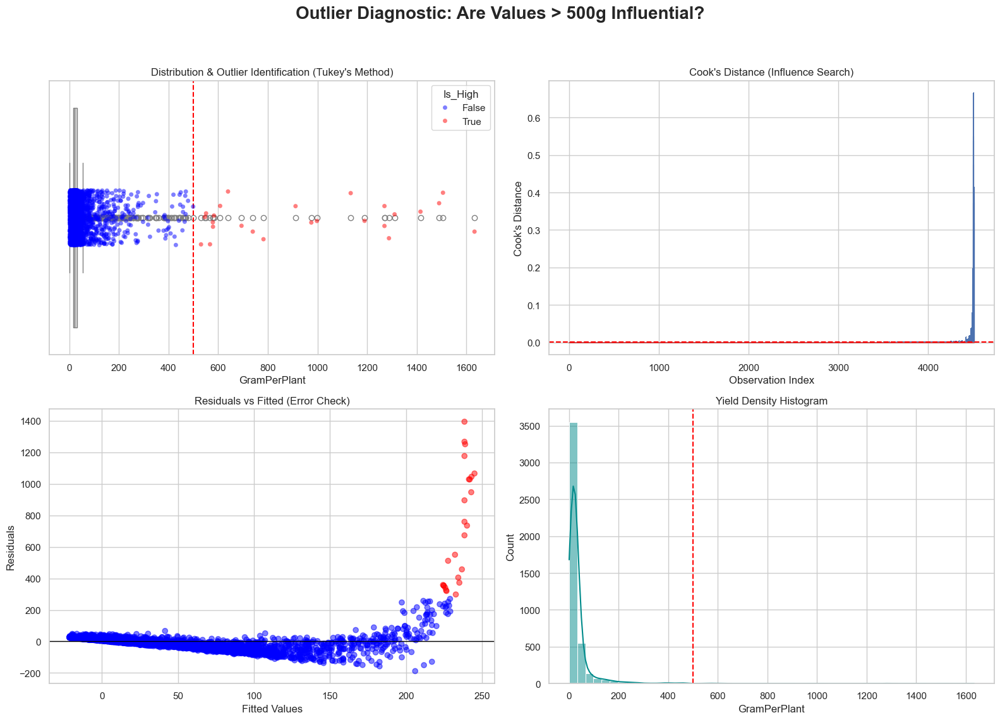

Total Observations: 4512
Observations > 500 g/plant: 25 (0.55%)


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import OLSInfluence

# --- DATA PREP ---
# (Assuming df is already loaded and processed as per your previous snippet)
analysis_df = df.dropna(subset=['GramPerPlant', 'HarvestableArea']).copy()

# Flag potential outliers
analysis_df['Is_High'] = analysis_df['GramPerPlant'] > 500

# --- SETUP PLOTS ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
sns.set_theme(style="whitegrid")

# 1. Boxplot: Visualizing the IQR and "Whiskers"
sns.boxplot(x=analysis_df['GramPerPlant'], ax=axes[0, 0], color='lightgray', showfliers=True)
sns.stripplot(x=analysis_df['GramPerPlant'], ax=axes[0, 0], hue=analysis_df['Is_High'], 
              palette={True: 'red', False: 'blue'}, alpha=0.5)
axes[0, 0].set_title("Distribution & Outlier Identification (Tukey's Method)")
axes[0, 0].axvline(500, color='red', linestyle='--', label='500g Threshold')

# 2. Cook's Distance: Statistical Influence
# We use a simple linear model to calculate influence
X = sm.add_constant(analysis_df['HarvestableArea'])
y = analysis_df['GramPerPlant']
model = sm.OLS(y, X).fit()
influence = OLSInfluence(model)
cooks = influence.cooks_distance[0]

axes[0, 1].stem(np.arange(len(cooks)), cooks, markerfmt=",")
axes[0, 1].set_title("Cook's Distance (Influence Search)")
axes[0, 1].set_xlabel("Observation Index")
axes[0, 1].set_ylabel("Cook's Distance")
# Conventional threshold for influential points: 4/n
thresh = 4 / len(analysis_df)
axes[0, 1].axhline(thresh, color='red', linestyle='--', label='Threshold')

# 3. Residuals vs Fitted: Checking for Heteroscedasticity
axes[1, 0].scatter(model.fittedvalues, model.resid, c=analysis_df['Is_High'].map({True:'red', False:'blue'}), alpha=0.5)
axes[1, 0].axhline(0, color='black', lw=1)
axes[1, 0].set_title("Residuals vs Fitted (Error Check)")
axes[1, 0].set_xlabel("Fitted Values")
axes[1, 0].set_ylabel("Residuals")

# 4. Histogram: Density of the Tail
sns.histplot(data=analysis_df, x='GramPerPlant', bins=50, kde=True, ax=axes[1, 1], color='darkcyan')
axes[1, 1].set_title("Yield Density Histogram")
axes[1, 1].axvline(500, color='red', linestyle='--')

plt.suptitle("Outlier Diagnostic: Are Values > 500g Influential?", fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# --- PRINT STATS ---
n_high = analysis_df['Is_High'].sum()
print(f"Total Observations: {len(analysis_df)}")
print(f"Observations > 500 g/plant: {n_high} ({n_high/len(analysis_df)*100:.2f}%)")

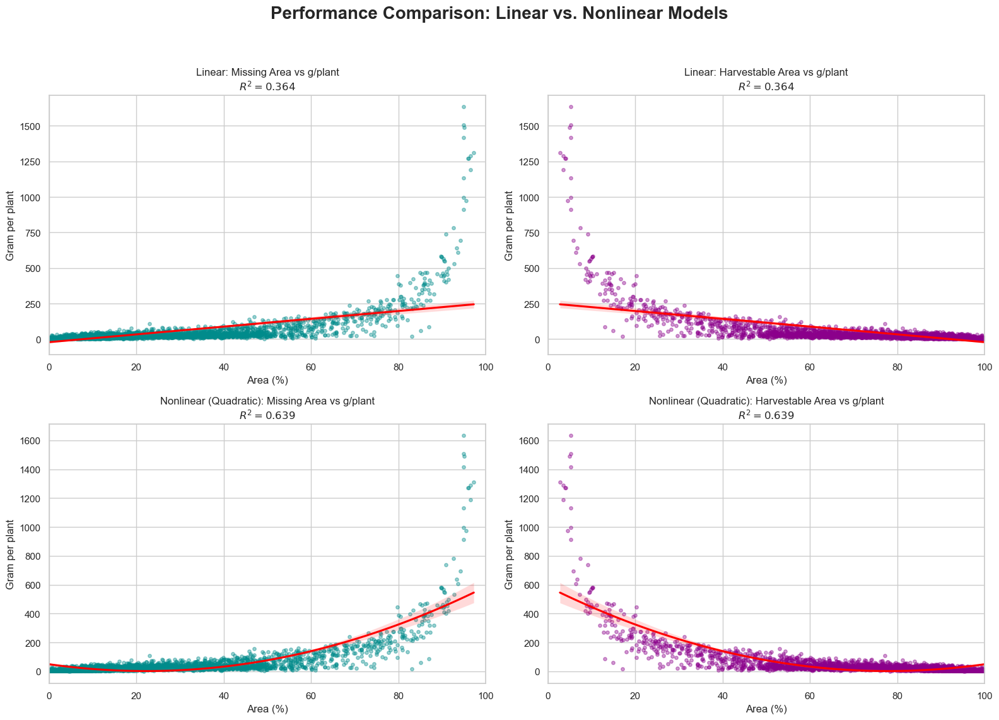

4-panel comparison plot generated.


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

# --- IMPROVED PLOTTING FUNCTION ---
def plot_panel(ax, x, y, title, color, poly_order=1):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    
    if len(xm) > poly_order:
        # Calculate R2 manually for the specific order
        coeffs = np.polyfit(xm, ym, poly_order)
        p = np.poly1d(coeffs)
        y_pred = p(xm)
        r2 = r2_score(ym, y_pred)
        
        sns.regplot(x=xm, y=ym, ax=ax, color=color, order=poly_order, 
                    scatter_kws={'alpha':0.4, 's':15}, line_kws={'color':'red'})
        ax.set_title(f"{title}\n$R^2 = {r2:.3f}$")
    else:
        ax.set_title(f"{title} (Insufficient Data)")
    
    ax.set_xlim(0, 100)
    ax.set_xlabel("Area (%)")
    ax.set_ylabel("Gram per plant")

# --- GENERATE 4-PANEL COMPARISON ---
pooled_df = df.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()

if not pooled_df.empty:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    sns.set_theme(style="whitegrid")

    # Row 1: Linear Relationships (Order 1)
    plot_panel(axes[0, 0], pooled_df['HA_Percent'], pooled_df['GramPerPlant'], 
               "Linear: Missing Area vs g/plant", "darkcyan", poly_order=1)
    plot_panel(axes[0, 1], pooled_df['HarvestableArea'], pooled_df['GramPerPlant'], 
               "Linear: Harvestable Area vs g/plant", "darkmagenta", poly_order=1)

    # Row 2: Nonlinear Relationships (Order 2)
    plot_panel(axes[1, 0], pooled_df['HA_Percent'], pooled_df['GramPerPlant'], 
               "Nonlinear (Quadratic): Missing Area vs g/plant", "darkcyan", poly_order=2)
    plot_panel(axes[1, 1], pooled_df['HarvestableArea'], pooled_df['GramPerPlant'], 
               "Nonlinear (Quadratic): Harvestable Area vs g/plant", "darkmagenta", poly_order=2)

    plt.suptitle("Performance Comparison: Linear vs. Nonlinear Models", fontsize=20, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("Linear_vs_Nonlinear_Comparison.png", dpi=300)
    plt.show()
    print("4-panel comparison plot generated.")

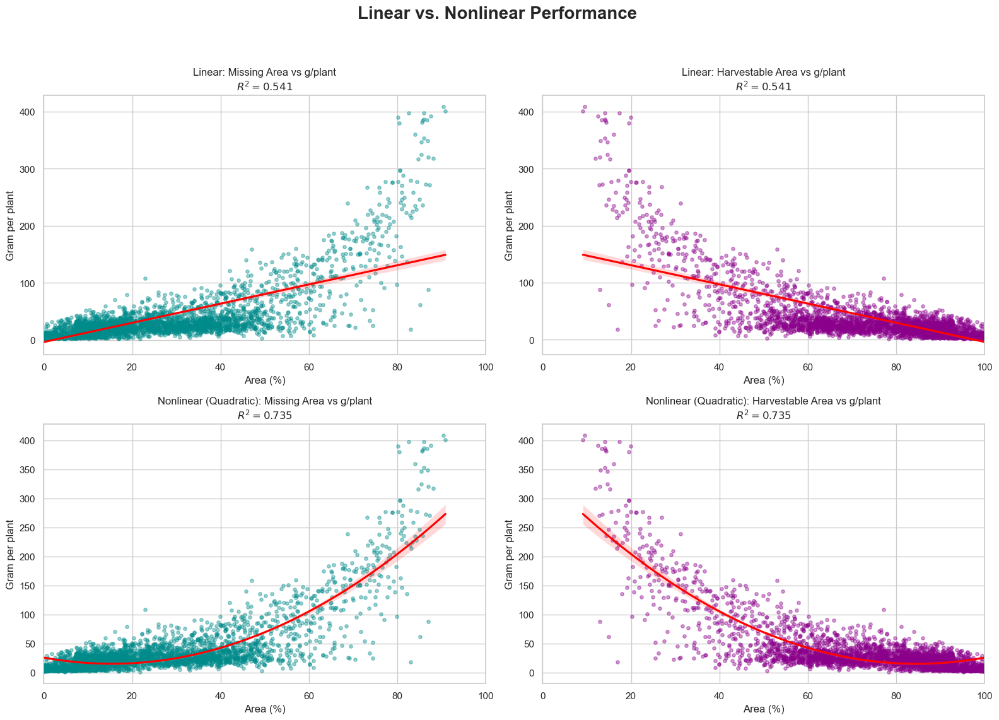

4-panel comparison plot generated. 42 points excluded as outliers or NaNs.


In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

# --- IMPROVED PLOTTING FUNCTION ---
def plot_panel(ax, x, y, title, color, poly_order=1):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    
    if len(xm) > poly_order:
        # Calculate R2 manually for the specific order
        coeffs = np.polyfit(xm, ym, poly_order)
        p = np.poly1d(coeffs)
        y_pred = p(xm)
        r2 = r2_score(ym, y_pred)
        
        sns.regplot(x=xm, y=ym, ax=ax, color=color, order=poly_order, 
                    scatter_kws={'alpha':0.4, 's':15}, line_kws={'color':'red'})
        ax.set_title(f"{title}\n$R^2 = {r2:.3f}$")
    else:
        ax.set_title(f"{title} (Insufficient Data)")
    
    ax.set_xlim(0, 100)
    ax.set_xlabel("Area (%)")
    ax.set_ylabel("Gram per plant")

# --- GENERATE 4-PANEL COMPARISON WITH OUTLIER FILTERING ---
# Create a copy for plotting and filter out values > 510
plot_ready_df = df.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 410]

if not plot_ready_df.empty:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    sns.set_theme(style="whitegrid")

    # Row 1: Linear Relationships (Order 1)
    plot_panel(axes[0, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Linear: Missing Area vs g/plant", "darkcyan", poly_order=1)
    plot_panel(axes[0, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Linear: Harvestable Area vs g/plant", "darkmagenta", poly_order=1)

    # Row 2: Nonlinear Relationships (Order 2)
    plot_panel(axes[1, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Nonlinear (Quadratic): Missing Area vs g/plant", "darkcyan", poly_order=2)
    plot_panel(axes[1, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Nonlinear (Quadratic): Harvestable Area vs g/plant", "darkmagenta", poly_order=2)

    plt.suptitle("Linear vs. Nonlinear Performance ", fontsize=20, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    plt.savefig("Linear_vs_Nonlinear_Filtered.png", dpi=300)
    plt.show()
    print(f"4-panel comparison plot generated. {len(df) - len(plot_ready_df)} points excluded as outliers or NaNs.")

# Note: The original 'df' remains untouched and still contains all original values.

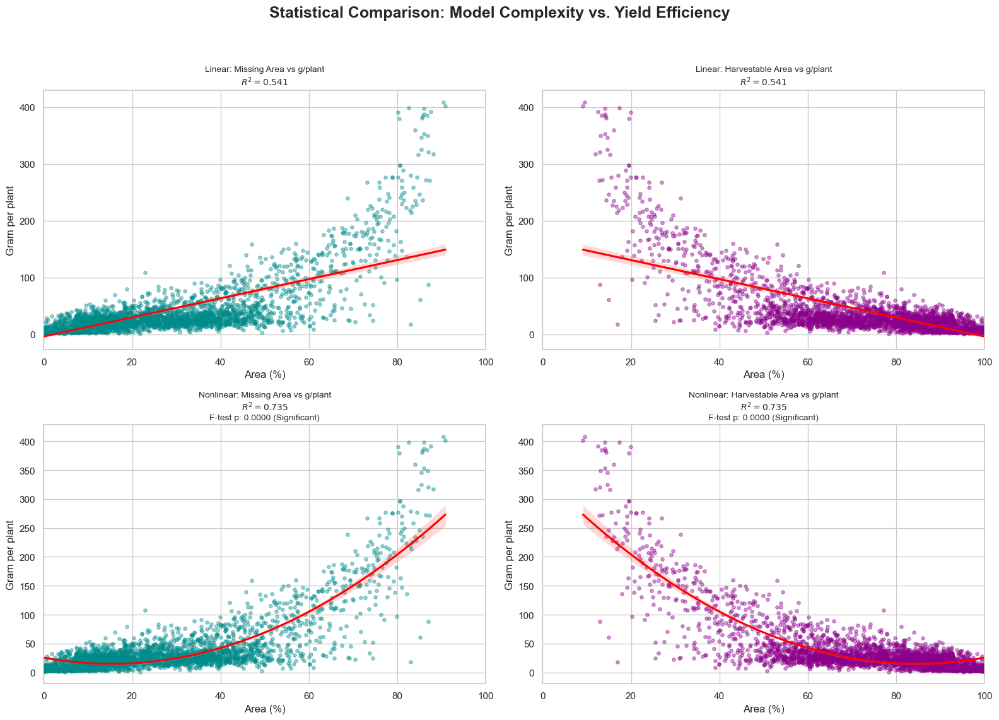

F-test complete. Graph saved with p-values.


In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings
from scipy import stats

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

# --- STATISTICAL TEST FUNCTION ---
def perform_f_test(x, y):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    n = len(xm)
    
    # Linear Model (Order 1)
    p1 = np.poly1d(np.polyfit(xm, ym, 1))
    sse1 = np.sum((ym - p1(xm))**2)
    df1 = n - 2
    
    # Quadratic Model (Order 2)
    p2 = np.poly1d(np.polyfit(xm, ym, 2))
    sse2 = np.sum((ym - p2(xm))**2)
    df2 = n - 3
    
    # F-test Calculation
    f_stat = ((sse1 - sse2) / (df1 - df2)) / (sse2 / df2)
    p_val = 1 - stats.f.cdf(f_stat, df1 - df2, df2)
    
    return f_stat, p_val

# --- IMPROVED PLOTTING FUNCTION ---
def plot_panel(ax, x, y, title, color, poly_order=1, p_val=None):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    
    if len(xm) > poly_order:
        coeffs = np.polyfit(xm, ym, poly_order)
        p = np.poly1d(coeffs)
        r2 = r2_score(ym, p(xm))
        
        sns.regplot(x=xm, y=ym, ax=ax, color=color, order=poly_order, 
                    scatter_kws={'alpha':0.4, 's':15}, line_kws={'color':'red'})
        
        display_title = f"{title}\n$R^2 = {r2:.3f}$"
        if p_val is not None:
            sig_text = "Significant" if p_val < 0.05 else "Not Significant"
            display_title += f"\nF-test p: {p_val:.4f} ({sig_text})"
        ax.set_title(display_title, fontsize=10)
    else:
        ax.set_title(f"{title} (Insufficient Data)")
    
    ax.set_xlim(0, 100)
    ax.set_xlabel("Area (%)")
    ax.set_ylabel("Gram per plant")

# --- GENERATE 4-PANEL COMPARISON ---
plot_ready_df = df.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 410]

if not plot_ready_df.empty:
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    sns.set_theme(style="whitegrid")

    # Run F-tests for each relationship type
    _, p_missing = perform_f_test(plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'])
    _, p_harvest = perform_f_test(plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'])

    # Row 1: Linear Relationships
    plot_panel(axes[0, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Linear: Missing Area vs g/plant", "darkcyan", poly_order=1)
    plot_panel(axes[0, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Linear: Harvestable Area vs g/plant", "darkmagenta", poly_order=1)

    # Row 2: Nonlinear Relationships (Adding F-test p-value here)
    plot_panel(axes[1, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Nonlinear: Missing Area vs g/plant", "darkcyan", poly_order=2, p_val=p_missing)
    plot_panel(axes[1, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Nonlinear: Harvestable Area vs g/plant", "darkmagenta", poly_order=2, p_val=p_harvest)

    plt.suptitle("Statistical Comparison: Model Complexity vs. Yield Efficiency", 
                 fontsize=18, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    plt.savefig("Linear_vs_Nonlinear_Statistical_Test.png", dpi=300)
    plt.show()
    print("F-test complete. Graph saved with p-values.")

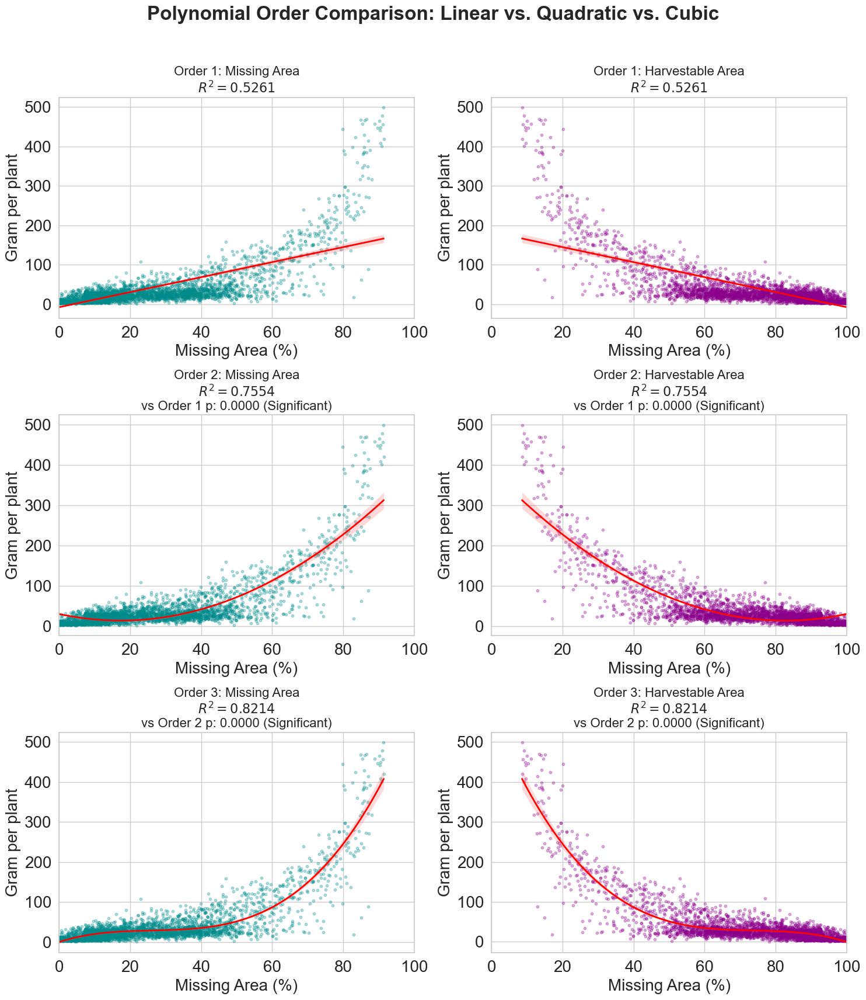

Multi-order analysis complete. 6-panel comparison generated.


In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import warnings
from scipy import stats

# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Standardize column names
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count',
    'Experiment Name': 'Experiment_Name'
}
df = df.rename(columns=column_map)

# Process metrics
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']
df['HarvestableArea'] = 100 - df['HA_Percent']

# --- SEQUENTIAL F-TEST FUNCTION ---
def perform_sequential_f_test(x, y, low_order, high_order):
    """Compares a lower order model to a higher order model."""
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    n = len(xm)
    
    # Lower Order Model
    p_low = np.poly1d(np.polyfit(xm, ym, low_order))
    sse_low = np.sum((ym - p_low(xm))**2)
    df_low = n - (low_order + 1)
    
    # Higher Order Model
    p_high = np.poly1d(np.polyfit(xm, ym, high_order))
    sse_high = np.sum((ym - p_high(xm))**2)
    df_high = n - (high_order + 1)
    
    # F-test Calculation
    f_stat = ((sse_low - sse_high) / (df_low - df_high)) / (sse_high / df_high)
    p_val = 1 - stats.f.cdf(f_stat, df_low - df_high, df_high)
    
    return p_val

# --- IMPROVED PLOTTING FUNCTION ---
def plot_panel(ax, x, y, title, color, poly_order=1, p_val=None, p_compare_text=""):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    
    if len(xm) > poly_order:
        coeffs = np.polyfit(xm, ym, poly_order)
        p = np.poly1d(coeffs)
        r2 = r2_score(ym, p(xm))
        
        sns.regplot(x=xm, y=ym, ax=ax, color=color, order=poly_order, 
                    scatter_kws={'alpha':0.3, 's':10}, line_kws={'color':'red', 'linewidth':2})
        
        display_title = f"{title}\n$R^2 = {r2:.4f}$"
        if p_val is not None:
            sig_text = "Significant" if p_val < 0.05 else "Not Significant"
            display_title += f"\n{p_compare_text} p: {p_val:.4f} ({sig_text})"
        ax.set_title(display_title, fontsize=16)
    else:
        ax.set_title(f"{title} (Insufficient Data)")
    
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize = 20)
    ax.set_ylabel("Gram per plant", fontsize = 20)
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)

# --- GENERATE 6-PANEL COMPARISON ---
plot_ready_df = df.dropna(subset=['GramPerPlant', 'HA_Percent', 'HarvestableArea']).copy()
#-----------------------------------------------------------------------------------------------
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 510]
#-----------------------------------------------------------------------------------------------

if not plot_ready_df.empty:
    fig, axes = plt.subplots(3, 2, figsize=(15, 18))
    sns.set_theme(style="whitegrid")

    # Calculate P-values for Sequential Improvements
    # Order 2 vs 1
    p21_missing = perform_sequential_f_test(plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 1, 2)
    p21_harvest = perform_sequential_f_test(plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 1, 2)
    # Order 3 vs 2
    p32_missing = perform_sequential_f_test(plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 2, 3)
    p32_harvest = perform_sequential_f_test(plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 2, 3)

    # Row 1: Order 1 (Linear)
    plot_panel(axes[0, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Order 1: Missing Area", "darkcyan", poly_order=1)
    plot_panel(axes[0, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Order 1: Harvestable Area", "darkmagenta", poly_order=1)

    # Row 2: Order 2 (Quadratic)
    plot_panel(axes[1, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Order 2: Missing Area", "darkcyan", poly_order=2, p_val=p21_missing, p_compare_text="vs Order 1")
    plot_panel(axes[1, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Order 2: Harvestable Area", "darkmagenta", poly_order=2, p_val=p21_harvest, p_compare_text="vs Order 1")

    # Row 3: Order 3 (Cubic)
    plot_panel(axes[2, 0], plot_ready_df['HA_Percent'], plot_ready_df['GramPerPlant'], 
               "Order 3: Missing Area", "darkcyan", poly_order=3, p_val=p32_missing, p_compare_text="vs Order 2")
    plot_panel(axes[2, 1], plot_ready_df['HarvestableArea'], plot_ready_df['GramPerPlant'], 
               "Order 3: Harvestable Area", "darkmagenta", poly_order=3, p_val=p32_harvest, p_compare_text="vs Order 2")

   
    plt.suptitle("Polynomial Order Comparison: Linear vs. Quadratic vs. Cubic", 
                 fontsize=24, fontweight='bold')
    plt.tick_params(axis='both', labelsize=20)  
    #plt.rcParams.update({'font.size': 20})
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    
    plt.savefig("Polynomial_Order_Comparison_6Panel.png", dpi=300)
    plt.show()

print("Multi-order analysis complete. 6-panel comparison generated.")

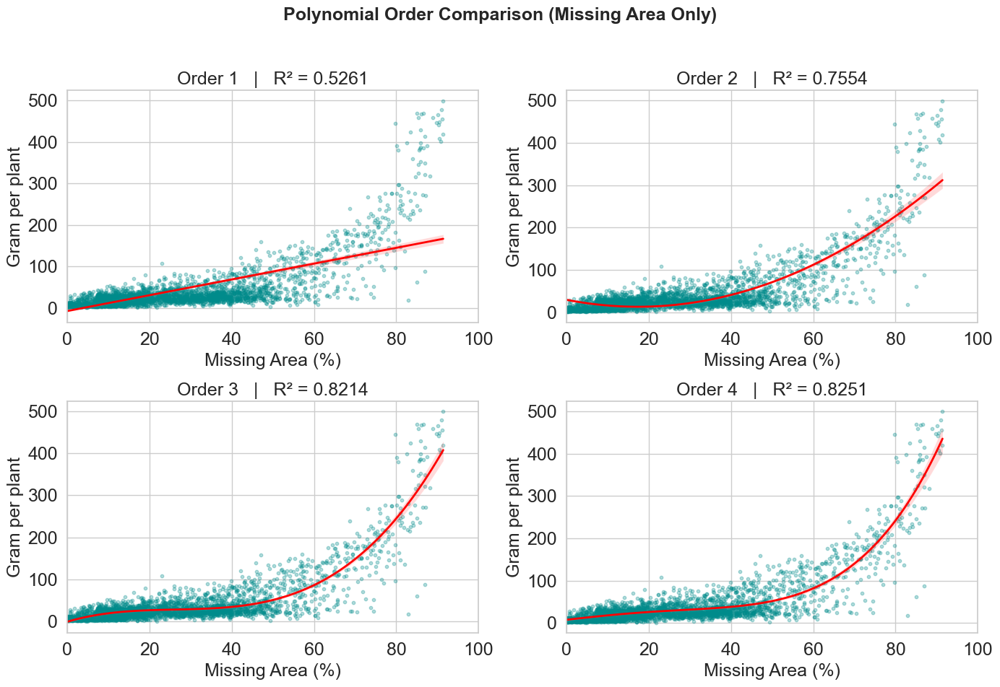

4-panel Missing Area plot generated.


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# --- LOAD DATA ---
file_path = r"C:\Users\bazrafka\Desktop\counting\DiscussionPaperData\Python\Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Clean columns
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count'
}
df = df.rename(columns=column_map)

# --- PROCESS DATA ---
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# Filter
plot_ready_df = df.dropna(subset=['GramPerPlant', 'HA_Percent']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 510]

# --- PLOT FUNCTION ---
def plot_panel(ax, x, y, order, color):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    
    if len(xm) > order:
        coeffs = np.polyfit(xm, ym, order)
        p = np.poly1d(coeffs)
        r2 = r2_score(ym, p(xm))
        
        sns.regplot(
            x=xm, y=ym, ax=ax,
            order=order,
            color=color,
            scatter_kws={'alpha':0.3, 's':10},
            line_kws={'color':'red', 'linewidth':2}
        )
        
        ax.set_title(f"Order {order}   |   R² = {r2:.4f}", fontsize=18)
    else:
        ax.set_title(f"Order {order} (Insufficient Data)")
    
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=18)
    ax.set_ylabel("Gram per plant", fontsize=18)
    ax.tick_params(axis='both', labelsize=18)

# --- PLOT 4 SUBFIGURES ---
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

orders = [1, 2, 3, 4]
axes = axes.flatten()

for i, order in enumerate(orders):
    plot_panel(
        axes[i],
        plot_ready_df['HA_Percent'],
        plot_ready_df['GramPerPlant'],
        order,
        color="darkcyan"
    )

plt.suptitle("Polynomial Order Comparison (Missing Area Only)", fontsize=18, fontweight='bold')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("Polynomial_Order_Comparison_4Panel_MissingArea.png", dpi=300)
plt.show()

print("4-panel Missing Area plot generated.")

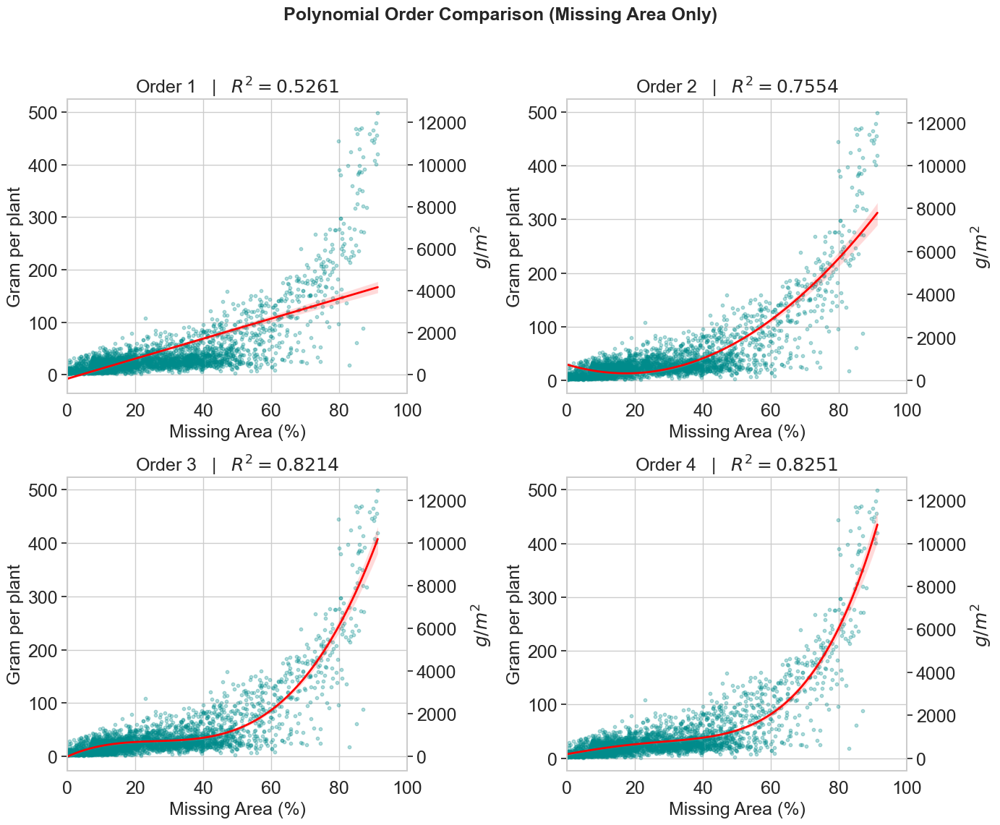

4-panel Missing Area plot with secondary g/m² axis generated.


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# --- LOAD DATA ---
# Note: Ensure the file is in your working directory or update the path as needed
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Clean columns
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count'
}
df = df.rename(columns=column_map)

# --- PROCESS DATA ---
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# Filter
plot_ready_df = df.dropna(subset=['GramPerPlant', 'HA_Percent']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 510]

# --- CONVERSION FACTOR ---
# Set this to your actual plants per square meter to scale the right Y-axis
PLANTS_PER_M2 = 25 

# --- PLOT FUNCTION ---
def plot_panel(ax, x, y, order, color):
    mask = ~np.isnan(x) & ~np.isnan(y)
    xm, ym = x[mask], y[mask]
    
    if len(xm) > order:
        coeffs = np.polyfit(xm, ym, order)
        p = np.poly1d(coeffs)
        r2 = r2_score(ym, p(xm))
        
        sns.regplot(
            x=xm, y=ym, ax=ax,
            order=order,
            color=color,
            scatter_kws={'alpha':0.3, 's':10},
            line_kws={'color':'red', 'linewidth':2}
        )
        
        ax.set_title(f"Order {order}   |   $R^2 = {r2:.4f}$", fontsize=18)
    else:
        ax.set_title(f"Order {order} (Insufficient Data)")
    
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=18)
    ax.set_ylabel("Gram per plant", fontsize=18)
    ax.tick_params(axis='both', labelsize=18)

    # --- ADD SECONDARY Y-AXIS ---
    ax2 = ax.twinx()
    y1, y2 = ax.get_ylim()
    # Scale the secondary axis limits based on the density factor
    ax2.set_ylim(y1 * PLANTS_PER_M2, y2 * PLANTS_PER_M2)
    ax2.set_ylabel(r"$g/m^2$", fontsize=18)
    ax2.tick_params(axis='y', labelsize=18)
    ax2.grid(False) # Disable secondary grid to keep the plot clean

# --- PLOT 4 SUBFIGURES ---
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(2, 2, figsize=(14, 12)) # Increased height for clarity

orders = [1, 2, 3, 4]
axes = axes.flatten()

for i, order in enumerate(orders):
    plot_panel(
        axes[i],
        plot_ready_df['HA_Percent'],
        plot_ready_df['GramPerPlant'],
        order,
        color="darkcyan"
    )

plt.suptitle("Polynomial Order Comparison (Missing Area Only)", fontsize=18, fontweight='bold')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("Polynomial_Order_Comparison_With_Yield_reverse.png", dpi=300)
plt.show()

print("4-panel Missing Area plot with secondary g/m² axis generated.")

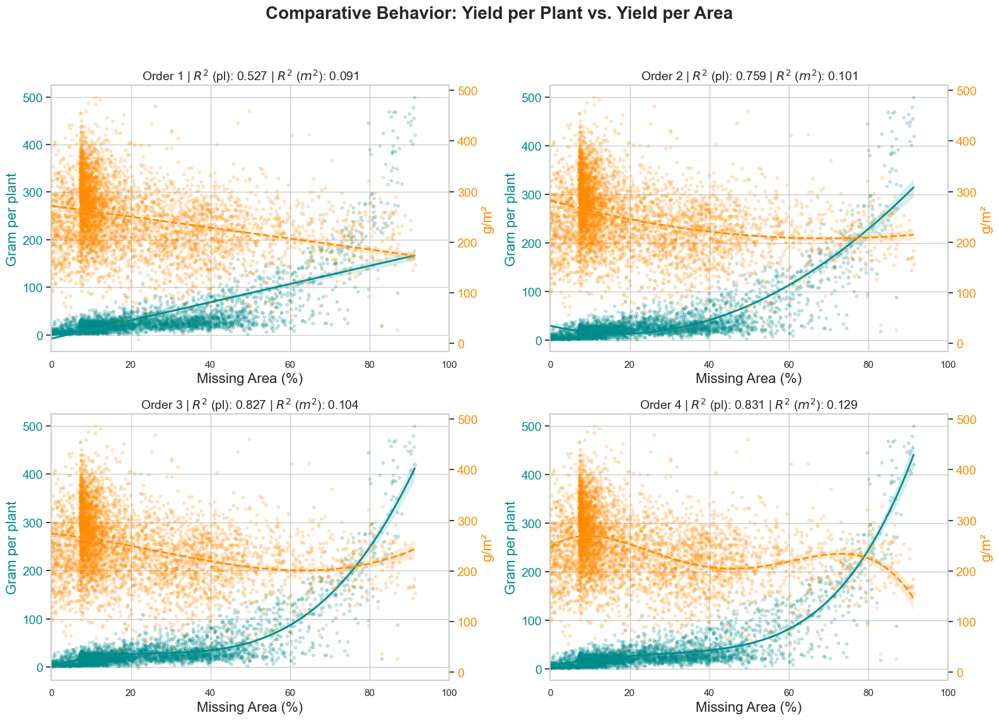

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# --- LOAD DATA ---
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Clean columns and calculate secondary variable
df.columns = df.columns.str.strip()
column_map = {
    'Uncorrected_Yield': 'UncorrectedYield',
    'HA%': 'HA_Percent',
    'Join_Count': 'Join_Count'
}
df = df.rename(columns=column_map)

# Conversion: 1 kg/ha = 0.1 g/m2
df['GramPerM2'] = df['UncorrectedYield'] * 0.1
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# Filter for clean data
plot_ready_df = df.dropna(subset=['GramPerPlant', 'GramPerM2', 'HA_Percent']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 510]

# --- PLOT FUNCTION ---
def plot_panel(ax, x, y1, y2, order):
    mask = ~np.isnan(x) & ~np.isnan(y1) & ~np.isnan(y2)
    xm, y1m, y2m = x[mask], y1[mask], y2[mask]
    
    # Plot Series 1: Gram per Plant (Left Axis)
    sns.regplot(
        x=xm, y=y1m, ax=ax, order=order, color="darkcyan",
        scatter_kws={'alpha':0.2, 's':10}, line_kws={'color':'darkcyan', 'linewidth':2, 'label':'g/plant'}
    )
    ax.set_ylabel("Gram per plant", color="darkcyan", fontsize=16)
    ax.tick_params(axis='y', labelcolor="darkcyan", labelsize=14)
    
    # Calculate R2 for g/plant
    p1 = np.poly1d(np.polyfit(xm, y1m, order))
    r2_y1 = r2_score(y1m, p1(xm))

    # Create Secondary Axis for Series 2: Gram per m2 (Right Axis)
    ax2 = ax.twinx()
    sns.regplot(
        x=xm, y=y2m, ax=ax2, order=order, color="darkorange",
        scatter_kws={'alpha':0.2, 's':10}, line_kws={'color':'darkorange', 'linewidth':2, 'linestyle':'--', 'label':'g/m²'}
    )
    ax2.set_ylabel("g/m²", color="darkorange", fontsize=16)
    ax2.tick_params(axis='y', labelcolor="darkorange", labelsize=14)
    ax2.grid(False)

    # Calculate R2 for g/m2
    p2 = np.poly1d(np.polyfit(xm, y2m, order))
    r2_y2 = r2_score(y2m, p2(xm))

    ax.set_title(f"Order {order} | $R^2$ (pl): {r2_y1:.3f} | $R^2$ ($m^2$): {r2_y2:.3f}", fontsize=14)
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=16)

# --- EXECUTE PLOT ---
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, order in enumerate([1, 2, 3, 4]):
    plot_panel(
        axes[i], 
        plot_ready_df['HA_Percent'], 
        plot_ready_df['GramPerPlant'], 
        plot_ready_df['GramPerM2'], 
        order
    )

plt.suptitle("Comparative Behavior: Yield per Plant vs. Yield per Area", fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("Comparative_Yield_Behavior.png", dpi=300)
plt.show()

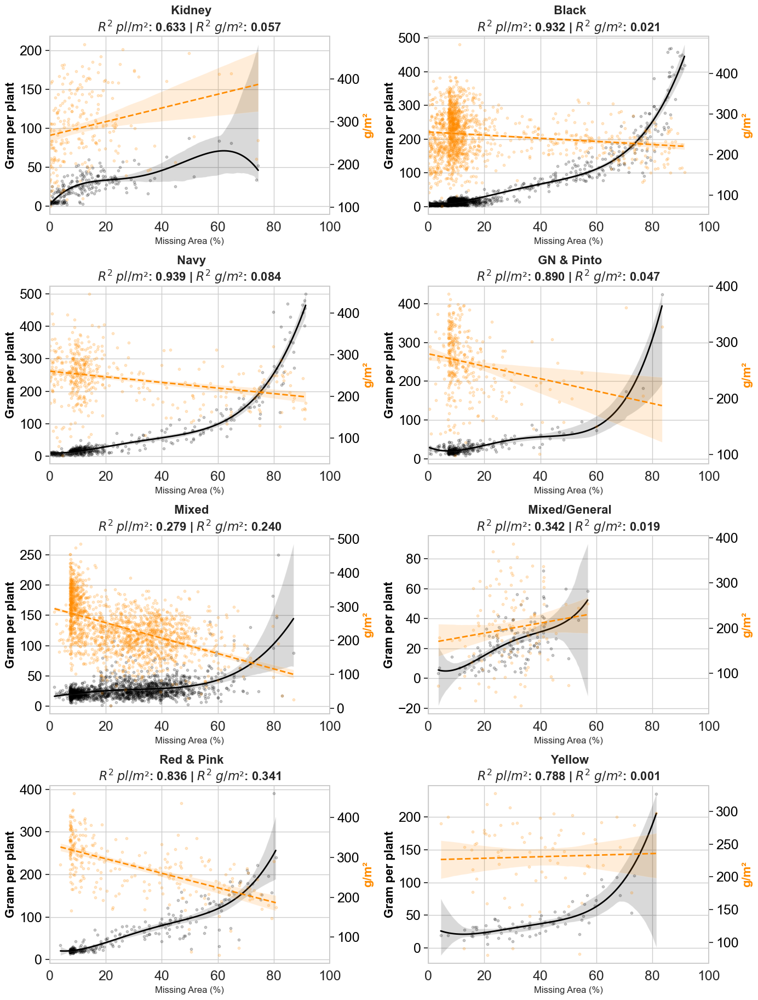

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# --- LOAD DATA ---
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Dictionary for Market Class mapping (extracted from your market_class vector)
market_class_map = {
    "2115": "Kidney", "2116": "Yellow", "2201": "Black", "2202": "Navy",
    "2217": "Black", "2218": "Navy", "2219": "Kidney",
    "2402": "Black", "2403": "Navy", "2404": "Black",
    "2405": "GN & Pinto", "2406": "GN & Pinto",
    "2407": "Red & Pink", "2408": "Mixed",
    "2409": "Mixed", "2410": "Mixed", "2411": "Mixed", "2412": "Mixed",
    "2502": "Black", "2503": "Navy", "2504": "Black",
    "2505": "GN & Pinto", "2506": "GN & Pinto",
    "2507": "Red & Pink", "2508": "Red & Pink", "2512": "Mixed",
    "2510": "Mixed/General", # Added based on your screenshot IDs (25101, 25102, etc.)
    "2511": "Mixed/General",
    "2520": "Mixed/General",
    "24116": "Black",
    "25103": "Cran",
    "25104": "Black",
    "25105": "White & Red Kidney",
    "25106": "Cran",
    "25107": "Black &  Navy",
    "25108": "Pinto",
    "25109": "Kidney",
    "25110": "Cran",
    "25111": "Black &  Navy",
    "25112": "Pinto",
    "25113": "Kidney",
    "25114": "Cran",
    
    
}

# Clean columns and calculate variables
df.columns = df.columns.str.strip()
column_map = {'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent', 'Join_Count': 'Join_Count'}
df = df.rename(columns=column_map)

# Unit conversion and feature engineering
df['GramPerM2'] = df['UncorrectedYield'] * 0.1
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# --- EXTRACT ID AND MAP MARKET CLASS ---
# Extracting the first 4 digits from 'Experiment' to match your mapping
df['Exp_Prefix'] = df['Experiment Name'].astype(str).str[:4]
df['Market_Class'] = df['Exp_Prefix'].map(market_class_map).fillna("Unclassified")

# Filter for clean data
plot_ready_df = df.dropna(subset=['GramPerPlant', 'GramPerM2', 'HA_Percent']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 510]

# --- PLOT FUNCTION ---
def plot_panel(ax, data, x_col, y1_col, y2_col, order1, order2, group_name):
    xm, y1m, y2m = data[x_col].values, data[y1_col].values, data[y2_col].values
    
    # Left Axis: Gram per Plant (Order 4)
    sns.regplot(x=xm, y=y1m, ax=ax, order=order1, color="black",
                scatter_kws={'alpha':0.2, 's':10}, 
                line_kws={'linewidth':2, 'label':f'g/plant (ord {order1})'})
    ax.set_ylabel("Gram per plant", color="black", fontsize=16, fontweight='bold')
    ax.tick_params(axis='y', labelcolor="black")
    ax.tick_params(axis='y', labelcolor="black", labelsize=18)
    
    # Right Axis: Gram per m2 (Order 1)
    ax2 = ax.twinx()
    sns.regplot(x=xm, y=y2m, ax=ax2, order=order2, color="darkorange",
                scatter_kws={'alpha':0.2, 's':10}, 
                line_kws={'linewidth':2, 'linestyle':'--', 'label':f'g/m² (ord {order2})'})
    ax2.set_ylabel("g/m²", color="darkorange", fontsize=16, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor="black")
    ax2.tick_params(axis='y', labelcolor="black", labelsize=18)
    ax2.grid(False)

    # R2 Calculation
    r2_y1 = r2_score(y1m, np.poly1d(np.polyfit(xm, y1m, order1))(xm))
    r2_y2 = r2_score(y2m, np.poly1d(np.polyfit(xm, y2m, order2))(xm))

    ax.set_title(f" {group_name}\n$R^2$ $pl/m²$: {r2_y1:.3f} | $R^2$ $g/m²$: {r2_y2:.3f}", fontsize=16, fontweight='bold')
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)")
    ax.tick_params(axis='x', labelsize=18)

# --- EXECUTE GROUPED PLOT ---
# Get unique market classes that actually exist in the data
available_classes = [c for c in plot_ready_df['Market_Class'].unique() if c != "Unclassified"]
num_classes = len(available_classes)

if num_classes > 0:
    cols = 2
    rows = (num_classes // cols) + (num_classes % cols > 0)

    fig, axes = plt.subplots(rows, cols, figsize=(14, 5 * rows))
    if num_classes == 1: axes = [axes]
    else: axes = axes.flatten()

    for i, m_class in enumerate(available_classes):
        class_data = plot_ready_df[plot_ready_df['Market_Class'] == m_class]
        plot_panel(axes[i], class_data, 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, m_class)

    # Remove empty plots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    #plt.suptitle("Comparative Behavior by Market Class\nQuartic (g/plant) vs. Linear (g/m²)", 
                 #fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig("Experiment_Yield_Analysisssssss.png", dpi=350)
    plt.show()
else:
    print("No matching Market Classes found. Please check the ID mapping.")

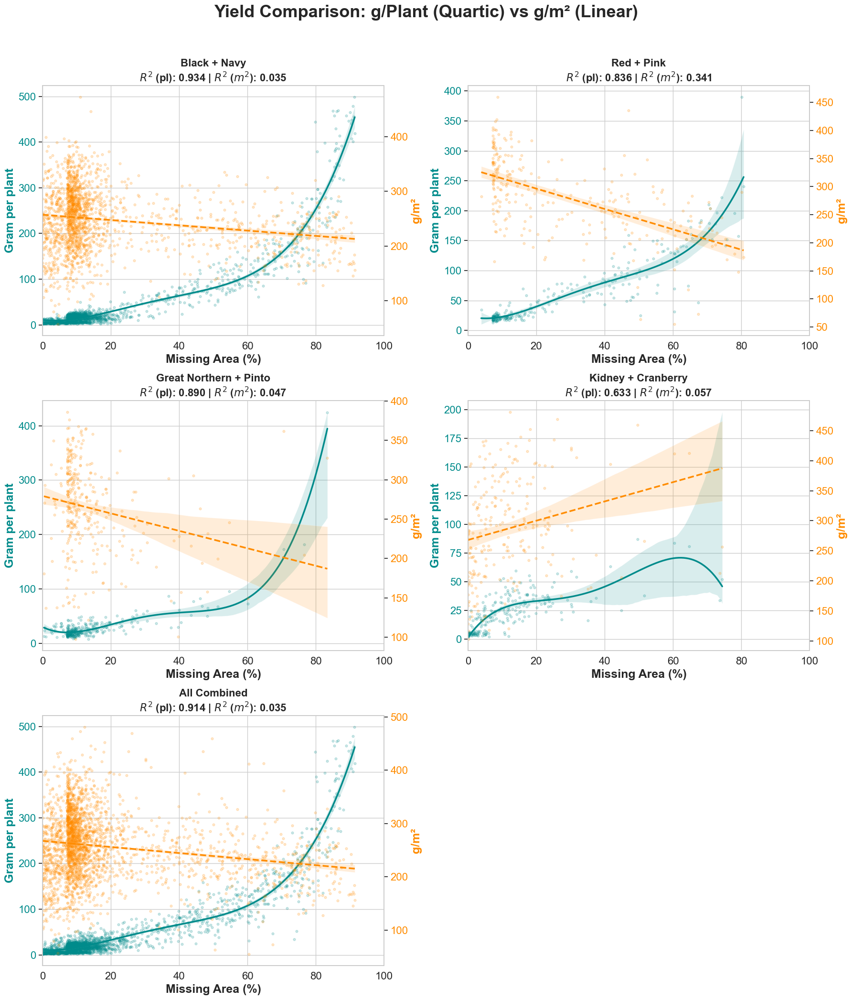

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# --- LOAD DATA ---
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# --- CLEAN AND PROCESS DATA ---
df.columns = df.columns.str.strip()
column_map = {'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent', 'Join_Count': 'Join_Count'}
df = df.rename(columns=column_map)

# Conversion and variable creation
df['GramPerM2'] = df['UncorrectedYield'] * 0.1
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# Initial dictionary mapping based on your previous input
market_class_map = {
    "2115": "Kidney", "2201": "Black", "2202": "Navy",
    "2217": "Black", "2218": "Navy", "2219": "Kidney",
    "2402": "Black", "2403": "Navy", "2404": "Black",
    "2405": "GN and Pinto", "2406": "GN and Pinto",
    "2407": "Red and Pink", "2502": "Black", "2503": "Navy", 
    "2504": "Black", "2505": "GN and Pinto", "2506": "GN and Pinto",
    "2507": "Red and Pink", "2508": "Red and Pink"
}

def assign_super_group(row):
    exp_name = str(row['Experiment Name'])
    prefix = exp_name[:4]
    name_lower = exp_name.lower()
    
    # 1. Check dictionary first
    base_class = market_class_map.get(prefix, None)
    
    # 2. Map to Super Groups
    # Black + Navy
    if base_class in ['Black', 'Navy'] or 'black' in name_lower or 'navy' in name_lower:
        return 'Black + Navy'
    # Red + Pink
    if base_class == 'Red and Pink' or 'red' in name_lower or 'pink' in name_lower:
        return 'Red + Pink'
    # Great Northern + Pinto
    if base_class == 'GN and Pinto' or 'pinto' in name_lower or 'gn' in name_lower:
        return 'Great Northern + Pinto'
    # Kidney + Cranberry
    if base_class == 'Kidney' or 'kidney' in name_lower or 'cran' in name_lower:
        return 'Kidney + Cranberry'
        
    return None

# Apply grouping and filter
df['Super_Group'] = df.apply(assign_super_group, axis=1)
filtered_df = df.dropna(subset=['GramPerPlant', 'GramPerM2', 'HA_Percent', 'Super_Group']).copy()
filtered_df = filtered_df[filtered_df['GramPerPlant'] <= 510]

# --- PREPARE DATASETS ---
super_groups = ['Black + Navy', 'Red + Pink', 'Great Northern + Pinto', 'Kidney + Cranberry']
group_datasets = {g: filtered_df[filtered_df['Super_Group'] == g] for g in super_groups}
group_datasets['All Combined'] = filtered_df # This includes only the 4 groups above

# --- PLOT FUNCTION ---
def plot_panel(ax, data, x_col, y1_col, y2_col, order1, order2, group_name):
    xm, y1m, y2m = data[x_col].values, data[y1_col].values, data[y2_col].values
    
    # Series 1: Gram per Plant (Left Axis) - Order 4
    sns.regplot(x=xm, y=y1m, ax=ax, order=order1, color="darkcyan",
                scatter_kws={'alpha':0.2, 's':12}, 
                line_kws={'linewidth':2.5, 'label':'g/plant'})
    ax.set_ylabel("Gram per plant", color="darkcyan", fontsize=18, fontweight='bold')
    ax.tick_params(axis='y', labelcolor="darkcyan", labelsize=16)
    
    # Series 2: Gram per m2 (Right Axis) - Order 1
    ax2 = ax.twinx()
    sns.regplot(x=xm, y=y2m, ax=ax2, order=order2, color="darkorange",
                scatter_kws={'alpha':0.2, 's':12}, 
                line_kws={'linewidth':2.5, 'linestyle':'--', 'label':'g/m²'})
    ax2.set_ylabel("g/m²", color="darkorange", fontsize=18, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor="darkorange", labelsize=16)
    ax2.grid(False)

    # R2 Calculation
    r2_y1 = r2_score(y1m, np.poly1d(np.polyfit(xm, y1m, order1))(xm))
    r2_y2 = r2_score(y2m, np.poly1d(np.polyfit(xm, y2m, order2))(xm))

    ax.set_title(f"{group_name}\n$R^2$ (pl): {r2_y1:.3f} | $R^2$ ($m^2$): {r2_y2:.3f}", 
                 fontsize=16, fontweight='bold')
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=18, fontweight='bold')
    ax.tick_params(axis='x', labelsize=16)

# --- EXECUTE PLOTTING ---
plot_names = ['Black + Navy', 'Red + Pink', 'Great Northern + Pinto', 'Kidney + Cranberry', 'All Combined']
fig, axes = plt.subplots(3, 2, figsize=(18, 22))
axes = axes.flatten()

for i, name in enumerate(plot_names):
    plot_panel(axes[i], group_datasets[name], 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, name)

# Remove the empty subplot at the end
fig.delaxes(axes[5])

plt.suptitle("Yield Comparison: g/Plant (Quartic) vs g/m² (Linear)", 
             fontsize=26, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.savefig("Grouped_Yield_Analysis.png", dpi=300)
plt.show()

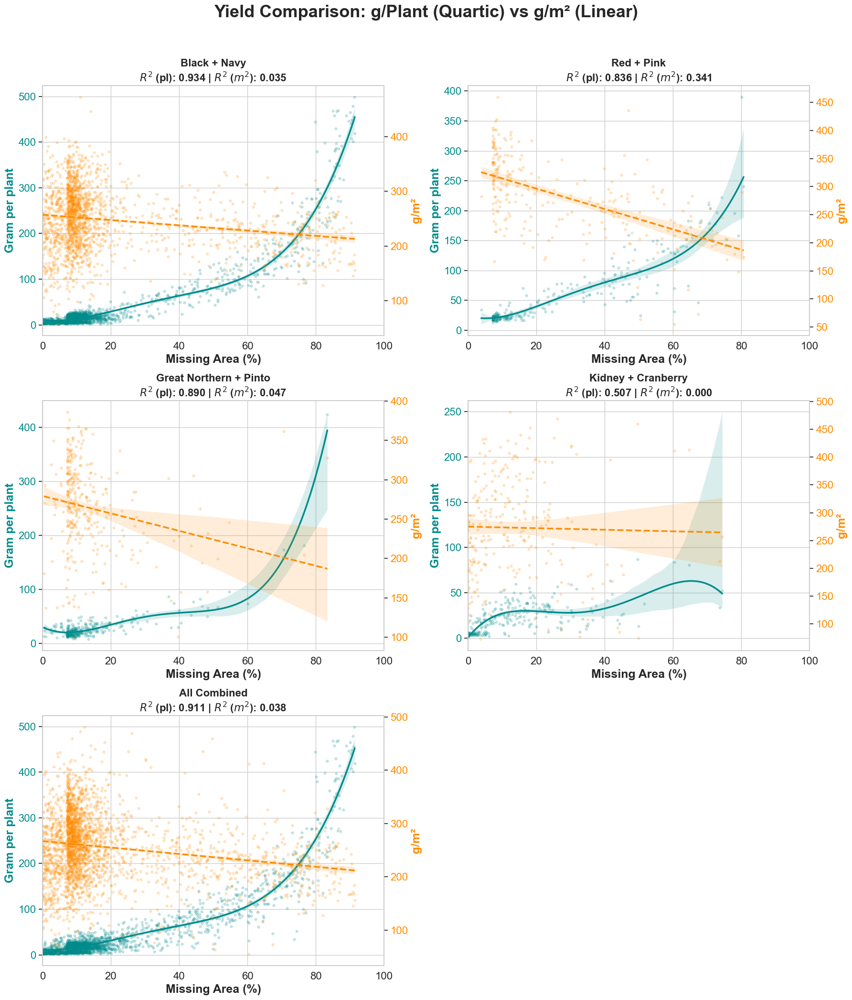

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np

# --- LOAD DATA ---
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# --- CLEAN AND PROCESS DATA ---
df.columns = df.columns.str.strip()
column_map = {'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent', 'Join_Count': 'Join_Count'}
df = df.rename(columns=column_map)

df['GramPerM2'] = df['UncorrectedYield'] * 0.1
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# Base dictionary mapping
market_class_map = {
    "2115": "Kidney", "2201": "Black", "2202": "Navy",
    "2217": "Black", "2218": "Navy", "2219": "Kidney",
    "2402": "Black", "2403": "Navy", "2404": "Black",
    "2405": "GN and Pinto", "2406": "GN and Pinto",
    "2407": "Red and Pink", "2502": "Black", "2503": "Navy", 
    "2504": "Black", "2505": "GN and Pinto", "2506": "GN and Pinto",
    "2507": "Red and Pink", "2508": "Red and Pink"
}

def assign_super_group(row):
    exp_name = str(row['Experiment Name'])
    prefix = exp_name[:4]
    full_id = exp_name[:5] # Check 5-digit ID for Cranberry
    name_lower = exp_name.lower()
    
    # 1. Direct match for Cranberry IDs
    if full_id in ['25106', '25110', '25114'] or 'cran' in name_lower:
        return 'Kidney + Cranberry'
    
    # 2. Check dictionary for others
    base_class = market_class_map.get(prefix, None)
    
    if base_class in ['Black', 'Navy'] or 'black' in name_lower or 'navy' in name_lower:
        return 'Black + Navy'
    if base_class == 'Red and Pink' or 'red' in name_lower or 'pink' in name_lower:
        return 'Red + Pink'
    if base_class == 'GN and Pinto' or 'pinto' in name_lower or 'gn' in name_lower:
        return 'Great Northern + Pinto'
    if base_class == 'Kidney' or 'kidney' in name_lower:
        return 'Kidney + Cranberry'
        
    return None

df['Super_Group'] = df.apply(assign_super_group, axis=1)
filtered_df = df.dropna(subset=['GramPerPlant', 'GramPerM2', 'HA_Percent', 'Super_Group']).copy()
filtered_df = filtered_df[filtered_df['GramPerPlant'] <= 510]

# --- PREPARE DATASETS ---
# Defining the order here ensures the 5th plot is the combined one
plot_names = [
    'Black + Navy', 
    'Red + Pink', 
    'Great Northern + Pinto', 
    'Kidney + Cranberry', 
    'All Combined'
]

group_datasets = {g: filtered_df[filtered_df['Super_Group'] == g] for g in plot_names if g != 'All Combined'}
group_datasets['All Combined'] = filtered_df

# --- PLOT FUNCTION ---
def plot_panel(ax, data, x_col, y1_col, y2_col, order1, order2, group_name):
    xm, y1m, y2m = data[x_col].values, data[y1_col].values, data[y2_col].values
    
    sns.regplot(x=xm, y=y1m, ax=ax, order=order1, color="darkcyan",
                scatter_kws={'alpha':0.2, 's':12}, 
                line_kws={'linewidth':2.5, 'label':'g/plant'})
    ax.set_ylabel("Gram per plant", color="darkcyan", fontsize=18, fontweight='bold')
    ax.tick_params(axis='y', labelcolor="darkcyan", labelsize=16)
    
    ax2 = ax.twinx()
    sns.regplot(x=xm, y=y2m, ax=ax2, order=order2, color="darkorange",
                scatter_kws={'alpha':0.2, 's':12}, 
                line_kws={'linewidth':2.5, 'linestyle':'--', 'label':'g/m²'})
    ax2.set_ylabel("g/m²", color="darkorange", fontsize=18, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor="darkorange", labelsize=16)
    ax2.grid(False)

    r2_y1 = r2_score(y1m, np.poly1d(np.polyfit(xm, y1m, order1))(xm))
    r2_y2 = r2_score(y2m, np.poly1d(np.polyfit(xm, y2m, order2))(xm))

    ax.set_title(f"{group_name}\n$R^2$ (pl): {r2_y1:.3f} | $R^2$ ($m^2$): {r2_y2:.3f}", 
                 fontsize=16, fontweight='bold')
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=18, fontweight='bold')
    ax.tick_params(axis='x', labelsize=16)

# --- EXECUTE PLOTTING ---
fig, axes = plt.subplots(3, 2, figsize=(18, 22))
axes = axes.flatten()

for i, name in enumerate(plot_names):
    plot_panel(axes[i], group_datasets[name], 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, name)

# Remove the empty 6th subplot
fig.delaxes(axes[5])

plt.suptitle("Yield Comparison: g/Plant (Quartic) vs g/m² (Linear)", 
             fontsize=26, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.show()

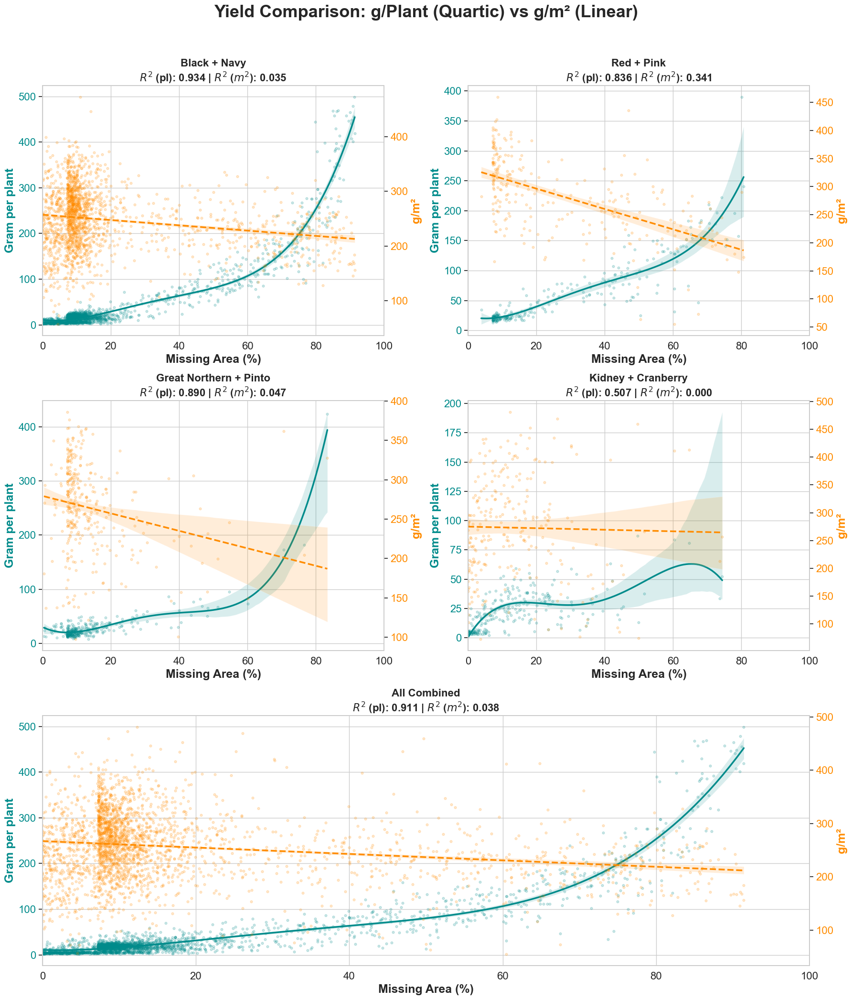

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import matplotlib.gridspec as gridspec  # Required for custom layouts

# --- LOAD DATA ---
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# --- CLEAN AND PROCESS DATA ---
df.columns = df.columns.str.strip()
column_map = {'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent', 'Join_Count': 'Join_Count'}
df = df.rename(columns=column_map)

df['GramPerM2'] = df['UncorrectedYield'] * 0.1
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# Base dictionary mapping
market_class_map = {
    "2115": "Kidney", "2201": "Black", "2202": "Navy",
    "2217": "Black", "2218": "Navy", "2219": "Kidney",
    "2402": "Black", "2403": "Navy", "2404": "Black",
    "2405": "GN and Pinto", "2406": "GN and Pinto",
    "2407": "Red and Pink", "2502": "Black", "2503": "Navy", 
    "2504": "Black", "2505": "GN and Pinto", "2506": "GN and Pinto",
    "2507": "Red and Pink", "2508": "Red and Pink"
}

def assign_super_group(row):
    exp_name = str(row['Experiment Name'])
    prefix = exp_name[:4]
    full_id = exp_name[:5] # Check 5-digit ID for Cranberry
    name_lower = exp_name.lower()
    
    # 1. Direct match for Cranberry IDs
    if full_id in ['25106', '25110', '25114'] or 'cran' in name_lower:
        return 'Kidney + Cranberry'
    
    # 2. Check dictionary for others
    base_class = market_class_map.get(prefix, None)
    
    if base_class in ['Black', 'Navy'] or 'black' in name_lower or 'navy' in name_lower:
        return 'Black + Navy'
    if base_class == 'Red and Pink' or 'red' in name_lower or 'pink' in name_lower:
        return 'Red + Pink'
    if base_class == 'GN and Pinto' or 'pinto' in name_lower or 'gn' in name_lower:
        return 'Great Northern + Pinto'
    if base_class == 'Kidney' or 'kidney' in name_lower:
        return 'Kidney + Cranberry'
        
    return None

df['Super_Group'] = df.apply(assign_super_group, axis=1)
filtered_df = df.dropna(subset=['GramPerPlant', 'GramPerM2', 'HA_Percent', 'Super_Group']).copy()
filtered_df = filtered_df[filtered_df['GramPerPlant'] <= 510]

# --- PREPARE DATASETS ---
# The logic remains the same; the plotting order is defined by grid placement below
super_groups = [
    'Black + Navy', 
    'Red + Pink', 
    'Great Northern + Pinto', 
    'Kidney + Cranberry'
]

# Create dictionaries to map names to actual data subsets
plot_data_map = {g: filtered_df[filtered_df['Super_Group'] == g] for g in super_groups}
plot_data_map['All Combined'] = filtered_df

# --- PLOT FUNCTION ---
def plot_panel(ax, data, x_col, y1_col, y2_col, order1, order2, group_name):
    xm, y1m, y2m = data[x_col].values, data[y1_col].values, data[y2_col].values
    
    sns.regplot(x=xm, y=y1m, ax=ax, order=order1, color="darkcyan",
                scatter_kws={'alpha':0.2, 's':12}, 
                line_kws={'linewidth':2.5, 'label':'g/plant'})
    ax.set_ylabel("Gram per plant", color="darkcyan", fontsize=18, fontweight='bold')
    ax.tick_params(axis='y', labelcolor="darkcyan", labelsize=16)
    
    ax2 = ax.twinx()
    sns.regplot(x=xm, y=y2m, ax=ax2, order=order2, color="darkorange",
                scatter_kws={'alpha':0.2, 's':12}, 
                line_kws={'linewidth':2.5, 'linestyle':'--', 'label':'g/m²'})
    ax2.set_ylabel("g/m²", color="darkorange", fontsize=18, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor="darkorange", labelsize=16)
    ax2.grid(False)

    r2_y1 = r2_score(y1m, np.poly1d(np.polyfit(xm, y1m, order1))(xm))
    r2_y2 = r2_score(y2m, np.poly1d(np.polyfit(xm, y2m, order2))(xm))

    ax.set_title(f"{group_name}\n$R^2$ (pl): {r2_y1:.3f} | $R^2$ ($m^2$): {r2_y2:.3f}", 
                 fontsize=16, fontweight='bold')
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=18, fontweight='bold')
    ax.tick_params(axis='x', labelsize=16)

# --- EXECUTE PLOTTING WITH GRIDSPEC ---

fig = plt.figure(figsize=(18, 22))
# Define a 3x2 grid
gs = gridspec.GridSpec(3, 2, figure=fig)

# Rows 0 and 1, Columns 0 and 1 (Individual groups)
axes = []
axes.append(fig.add_subplot(gs[0, 0])) # Row 0, Col 0: Black + Navy
axes.append(fig.add_subplot(gs[0, 1])) # Row 0, Col 1: Red + Pink
axes.append(fig.add_subplot(gs[1, 0])) # Row 1, Col 0: GN + Pinto
axes.append(fig.add_subplot(gs[1, 1])) # Row 1, Col 1: Kidney + Cranberry

# Plot individual groups in the first two rows
for i, name in enumerate(super_groups):
    plot_panel(axes[i], plot_data_map[name], 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, name)

# Row 2, span ALL columns (Combined view)
# This replaces the need for fig.delaxes(axes[5])
ax_combined = fig.add_subplot(gs[2, :]) # gs[row, column_range] where : means all

# Plot the combined data
plot_panel(ax_combined, plot_data_map['All Combined'], 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, 'All Combined')

plt.suptitle("Yield Comparison: g/Plant (Quartic) vs g/m² (Linear)", 
             fontsize=26, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.show()

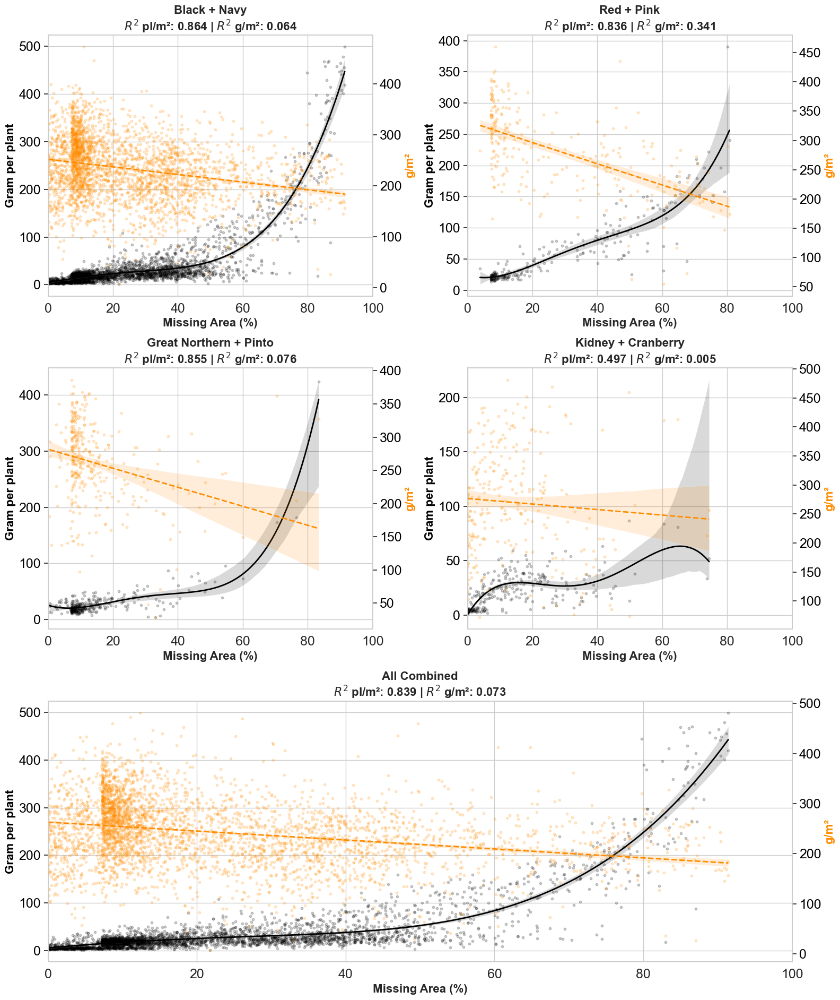

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import numpy as np
import matplotlib.gridspec as gridspec

# --- LOAD DATA ---
file_path = "Ali_Data_kg_ha_updated.xlsx"
df = pd.read_excel(file_path)

# Dictionary for Market Class mapping
market_class_map = {
    "2115": "Kidney", "2116": "Yellow", "2201": "Black", "2202": "Navy",
    "2217": "Black", "2218": "Navy", "2219": "Kidney",
    "2402": "Black", "2403": "Navy", "2404": "Black",
    "2405": "GN & Pinto", "2406": "GN & Pinto",
    "2407": "Red & Pink", "2408": "Mixed",
    "2409": "Mixed", "2410": "Mixed", "2411": "Mixed", "2412": "Mixed",
    "2502": "Black", "2503": "Navy", "2504": "Black",
    "2505": "GN & Pinto", "2506": "GN & Pinto",
    "2507": "Red & Pink", "2508": "Red & Pink", "2512": "Mixed",
    "2510": "Mixed/General", "2511": "Mixed/General", "2520": "Mixed/General",
    "24116": "Black", "25103": "Cran", "25104": "Black",
    "25105": "White & Red Kidney", "25106": "Cran", "25107": "Black & Navy",
    "25108": "Pinto", "25109": "Kidney", "25110": "Cran",
    "25111": "Black & Navy", "25112": "Pinto", "25113": "Kidney", "25114": "Cran"
}

# Clean columns and calculate variables
df.columns = df.columns.str.strip()
column_map = {'Uncorrected_Yield': 'UncorrectedYield', 'HA%': 'HA_Percent', 'Join_Count': 'Join_Count'}
df = df.rename(columns=column_map)

df['GramPerM2'] = df['UncorrectedYield'] * 0.1
df['Join_Count'] = df['Join_Count'].replace(0, np.nan)
df['GramPerPlant'] = df['PLOTWT'] / df['Join_Count']

# --- SUPER GROUP LOGIC ---
def assign_super_group(row):
    exp_name = str(row['Experiment Name'])
    prefix4 = exp_name[:4]
    prefix5 = exp_name[:5]
    name_lower = exp_name.lower()
    
    # Check 5-digit then 4-digit mapping
    base_class = market_class_map.get(prefix5, market_class_map.get(prefix4, None))
    
    # Logic for Super Groups
    if base_class in ['Black', 'Navy', 'Black & Navy'] or 'black' in name_lower or 'navy' in name_lower:
        return 'Black + Navy'
    if base_class in ['Red & Pink', 'Red and Pink'] or 'red' in name_lower or 'pink' in name_lower:
        return 'Red + Pink'
    if base_class in ['GN & Pinto', 'Pinto'] or 'pinto' in name_lower or 'gn' in name_lower:
        return 'Great Northern + Pinto'
    if base_class in ['Kidney', 'Cran'] or 'kidney' in name_lower or 'cran' in name_lower:
        return 'Kidney + Cranberry'
    return None

df['Super_Group'] = df.apply(assign_super_group, axis=1)
plot_ready_df = df.dropna(subset=['GramPerPlant', 'GramPerM2', 'HA_Percent', 'Super_Group']).copy()
plot_ready_df = plot_ready_df[plot_ready_df['GramPerPlant'] <= 510]

# --- PLOT FUNCTION ---
def plot_panel(ax, data, x_col, y1_col, y2_col, order1, order2, group_name):
    xm, y1m, y2m = data[x_col].values, data[y1_col].values, data[y2_col].values
    
    # Left Axis: Gram per Plant (Order 4) - Black
    sns.regplot(x=xm, y=y1m, ax=ax, order=order1, color="black",
                scatter_kws={'alpha':0.2, 's':10}, 
                line_kws={'linewidth':2, 'label':f'g/plant (ord {order1})'})
    ax.set_ylabel("Gram per plant", color="black", fontsize=16, fontweight='bold')
    ax.tick_params(axis='y', labelcolor="black", labelsize=18)
    
    # Right Axis: Gram per m2 (Order 1) - Orange
    ax2 = ax.twinx()
    sns.regplot(x=xm, y=y2m, ax=ax2, order=order2, color="darkorange",
                scatter_kws={'alpha':0.2, 's':10}, 
                line_kws={'linewidth':2, 'linestyle':'--', 'label':f'g/m² (ord {order2})'})
    ax2.set_ylabel("g/m²", color="darkorange", fontsize=16, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor="black", labelsize=18)
    ax2.grid(False)

    # R2 Calculation
    r2_y1 = r2_score(y1m, np.poly1d(np.polyfit(xm, y1m, order1))(xm))
    r2_y2 = r2_score(y2m, np.poly1d(np.polyfit(xm, y2m, order2))(xm))

    ax.set_title(f"{group_name}\n$R^2$ pl/m²: {r2_y1:.3f} | $R^2$ g/m²: {r2_y2:.3f}", 
                 fontsize=16, fontweight='bold')
    ax.set_xlim(0, 100)
    ax.set_xlabel("Missing Area (%)", fontsize=16, fontweight='bold')
    ax.tick_params(axis='x', labelsize=18)

# --- EXECUTE LAYOUT ---
super_groups = ['Black + Navy', 'Red + Pink', 'Great Northern + Pinto', 'Kidney + Cranberry']

fig = plt.figure(figsize=(16, 20))
gs = gridspec.GridSpec(3, 2, figure=fig)

# Plot top 4 individual groups
for i, name in enumerate(super_groups):
    ax = fig.add_subplot(gs[i // 2, i % 2])
    group_data = plot_ready_df[plot_ready_df['Super_Group'] == name]
    plot_panel(ax, group_data, 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, name)

# Plot All Combined at the bottom (Spanning both columns)
ax_comb = fig.add_subplot(gs[2, :])
plot_panel(ax_comb, plot_ready_df, 'HA_Percent', 'GramPerPlant', 'GramPerM2', 4, 1, 'All Combined')

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig("Final_Grouped_Yield_Analysis.png", dpi=350)
plt.show()